# This notebook demonstrates plotting seaonal mean MCS rain statistics on maps
## The monthly data is produced by: 
* /src/calc_tbpf_mcs_monthly_rainmap.py

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import glob, os
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
import colormath, colormath.color_objects, colormath.color_conversions
from colormath.color_objects import sRGBColor
import urllib
import re
import colorcet as cc
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from itertools import chain
import copy
import colorcet as cc
%matplotlib inline

In [3]:
# Sepcify directory of the MCS track stats file
rootdir = '/pscratch/sd/w/wcmca1/SCREAM-cess/global/'
gpmdir = f'{rootdir}gpm/stats/monthly/'
m1dir = f'{rootdir}control_nudged/stats/monthly/'
m2dir = f'{rootdir}control_free/stats/monthly/'

name_map1 = {'obs':'OBS', 'm1':'EAMxx-Nudged', 'm2':'EAMxx-Free'}
name_map2 = {'obs':'OBS', 'm1':'EAMxx-N', 'm2':'EAMxx-F'}

# start_year = 2019
# end_year = 2020

# # Create a list of dates in the format 'year-months'
# dates = []
# for iy in range(start_year, end_year+1, 1):
#     dates = dates + [d.strftime('%Y%m') for d in pd.date_range(start=f'{iy}-01', end=f'{iy}-12', freq='MS')]

datetime_range = pd.to_datetime(['2019-09-01T00', '2020-09-01T00'])
dates = pd.date_range(start=min(datetime_range), end=max(datetime_range), freq='MS').strftime('%Y%m')
    
# Find all files from the list of dates
m1files = []
m2files = []
gpmfiles = []

for dd in dates:
    m1files = m1files + sorted(glob.glob(f'{m1dir}mcs_rainmap_{dd}*.nc'))
    m2files = m2files + sorted(glob.glob(f'{m2dir}mcs_rainmap_{dd}*.nc'))
    gpmfiles = gpmfiles + sorted(glob.glob(f'{gpmdir}mcs_rainmap_{dd}*.nc'))

nyears_gpm = 1
nyears_m1 = 1
nyears_m2 = 1
    
# # topfile = '/global/project/projectdirs/m1657/zfeng/SAAG/map_data/wrf_landmask_reg2imerg.nc'

figdir = f'/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/


In [4]:
gpmfiles, m1files, m2files

(['/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_201909.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_201910.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_201911.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_201912.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202001.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202002.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202003.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202004.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202005.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202006.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/monthly/mcs_rainmap_202007.nc',
  '/pscratch/sd/w/wcmca1/SCREAM-cess/global/gpm/stats/

# These customed functions enables use of [NCL colormaps](https://www.ncl.ucar.edu/Document/Graphics/color_table_gallery.shtml)

In [5]:
color_obj_dict = {'sRGB':colormath.color_objects.sRGBColor,
                  'HSV':colormath.color_objects.HSVColor,
                  'Lab':colormath.color_objects.LabColor,
                  'LCHuv':colormath.color_objects.LCHuvColor,
                  'LCHab':colormath.color_objects.LCHabColor,
                  'XYZ':colormath.color_objects.XYZColor}

def __rgb_to_array(rgb_color):
    r = np.minimum(1, round(rgb_color.rgb_r*10000)/10000)
    g = np.minimum(1, round(rgb_color.rgb_g*10000)/10000)
    b = np.minimum(1, round(rgb_color.rgb_b*10000)/10000)
    return r,g,b


def create_palette(start_rgb, end_rgb, n, colorspace):
    # convert start and end to a point in the given colorspace
    start = colormath.color_conversions.convert_color(start_rgb, colorspace).get_value_tuple()
    end = colormath.color_conversions.convert_color(end_rgb, colorspace).get_value_tuple()

    # create a set of n points along start to end
    points = list(zip(*[np.linspace(start[i], end[i], n) for i in range(3)]))

    # create a color for each point and convert back to rgb
    rgb_colors = [colormath.color_conversions.convert_color(colorspace(*point), sRGBColor) for point in points]

    # finally convert rgb colors back to hex
    return [__rgb_to_array(color) for color in  rgb_colors]


def __retrive_NCL_webcontent(cmapname):
    target_url = 'https://www.ncl.ucar.edu/Document/Graphics/ColorTables/Files/%s.rgb' % cmapname
    request = urllib.request.urlopen(target_url)
    return request


def __collect_discrete_NCL_cmap(cmapname):
    rawdata = __retrive_NCL_webcontent(cmapname)
    
    cmap_color_list = list()
    
    color_section_sig = 0
    
    for line in rawdata:
        
        line_decode = line.decode('utf-8')
        info = re.split('\s+', line_decode.replace('\n','').replace('^\s+',''))

        if color_section_sig==1:
            if info[0]=='' and len(info)>=3:
                if np.maximum(np.maximum(float(info[1]), float(info[2])), float(info[3]))>1:
                    cmap_color_list.append((float(info[1])/255, float(info[2])/255, float(info[3])/255))
                else:
                    cmap_color_list.append((float(info[1]), float(info[2]), float(info[3])))
            if len(info)==3:
                if ';' in info[0] or '#' in info[0]:
                    whatisthis = 's'
                else:
                    if np.maximum(np.maximum(float(info[0]), float(info[1])), float(info[2]))>1:
                        cmap_color_list.append((float(info[0])/255, float(info[1])/255, float(info[2])/255))
                    else:
                        cmap_color_list.append((float(info[0]), float(info[1]), float(info[2])))
        
        if 'ncolors' in str(info[0]):
            color_section_sig = 1  # meaning now we are at color lines (or "r g b" line)

    return cmap_color_list


def __cmap_refinement(raw_cmap_rgb, n_interpolate=10, workspace=color_obj_dict['sRGB']):
    # workspace:  choose which color space the refinement is conducted.
    #             refer to https://stackoverflow.com/questions/55032648/given-a-start-color-and-a-middle-color-how-to-get-the-remaining-colors-python

    n_in = len(raw_cmap_rgb)

    new_array = list()

    for i in np.arange(n_in-1):
        out_colors = create_palette(sRGBColor(*raw_cmap_rgb[i], is_upscaled=False), sRGBColor(*raw_cmap_rgb[i+1], is_upscaled=False), n_interpolate+1, workspace)
        for j in np.arange(len(out_colors)-1):
            new_array.append(out_colors[j])

    return new_array


def generate_NCL_cmap(cmapname, cont_opt=False, cont_param_n=10, cont_param_ws='sRGB',
                      white_first=False, white_ext=False, reverse_cmap=False):
    # description:
    #     cmapname:      taken as shown on the NCL website
    #     cont_opt:      to convert the discreate colormap to continuous colormap
    #     cont_param_n:  how many "intermediate" colors to be inserted to the nearby discreate colors
    #     cont_param_ws: color space to conduct interploation. Default to "sRGB", which should work for most cases
    #     white_first:   whether to set the first color as white. May be useful if the minimum does not mean anything
    #     white_ext:     whether to add this above white as an extended color (when set to True), or just replace the first color (when set to False).
    #     reverse_cmap:  similar to "_r" in colormap.
    # note:  reverse_cmap is applied first, then white_first option.

    cmap_discrete_raw = __collect_discrete_NCL_cmap(cmapname)

    if reverse_cmap==True:
        cmap_discrete_raw.reverse()

    if white_first==True:
        if white_ext==True:
            cmap_discrete = list()
            cmap_discrete.append((1,1,1))
            for i in np.arange(len(cmap_discrete_raw)):
                cmap_discrete.append(cmap_discrete_raw[int(i)])
        else:
            cmap_discrete = cmap_discrete_raw.copy()
        cmap_discrete[0] = (1,1,1)
    else:
        cmap_discrete = cmap_discrete_raw

    if cont_opt==False:
        out_cmap = cmap_discrete

    if cont_opt==True:
        out_cmap = __cmap_refinement(cmap_discrete, n_interpolate=cont_param_n, workspace=color_obj_dict[cont_param_ws])

    return mpl.colors.ListedColormap(out_cmap)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """ Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [6]:
# # Read topography data
# dstop = xr.open_dataset(topfile)
# # Convert surface geopotential to height in meters
# ter = dstop.HGT.squeeze()
# landmask = dstop.LANDMASK.squeeze()
# ter_s = gaussian_filter(ter, 1)
# lon_ter = dstop.lon
# lat_ter = dstop.lat
# dstop

In [7]:
# Read m1 rain map files
dsm1 = xr.open_mfdataset(m1files, concat_dim='time', combine='nested')
lon = dsm1.lon
lat = dsm1.lat
dsm1.load()

<xarray.Dataset> Size: 1GB
Dimensions:                  (time: 13, lat: 1200, lon: 3600)
Coordinates:
  * time                     (time) datetime64[ns] 104B 2019-09-01 ... 2020-0...
  * lat                      (lat) float64 10kB -59.95 -59.85 ... 59.85 59.95
  * lon                      (lon) float64 29kB -179.9 -179.8 ... 179.8 179.9
Data variables:
    longitude                (time, lat, lon) float32 225MB -179.9 ... 179.9
    latitude                 (time, lat, lon) float32 225MB -59.95 ... 59.95
    precipitation            (time, lat, lon) float32 225MB 100.0 ... 0.0004751
    mcs_precipitation        (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    mcs_precipitation_count  (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    mcs_cloud_count          (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    ntimes                   (time) float32 52B 720.0 744.0 720.0 ... 744.0 1.0
Attributes:
    title:       MCS precipitation accumulation
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    created_on:  Mon Nov 25 17:58:40 2024

In [8]:
# Read m2 stats map files
dsm2 = xr.open_mfdataset(m2files, concat_dim='time', combine='nested')
dsm2.load()

<xarray.Dataset> Size: 1GB
Dimensions:                  (time: 13, lat: 1200, lon: 3600)
Coordinates:
  * time                     (time) datetime64[ns] 104B 2019-09-01 ... 2020-0...
  * lat                      (lat) float64 10kB -59.95 -59.85 ... 59.85 59.95
  * lon                      (lon) float64 29kB -179.9 -179.8 ... 179.8 179.9
Data variables:
    longitude                (time, lat, lon) float32 225MB -179.9 ... 179.9
    latitude                 (time, lat, lon) float32 225MB -59.95 ... 59.95
    precipitation            (time, lat, lon) float32 225MB 82.08 ... 0.02927
    mcs_precipitation        (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    mcs_precipitation_count  (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    mcs_cloud_count          (time, lat, lon) float32 225MB 0.0 0.0 ... 0.0 0.0
    ntimes                   (time) float32 52B 720.0 744.0 720.0 ... 744.0 1.0
Attributes:
    title:       MCS precipitation accumulation
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    created_on:  Mon Nov 25 20:31:46 2024

In [9]:
# Read GPM rain map files
dsgpm = xr.open_mfdataset(gpmfiles, concat_dim='time', combine='nested')
dsgpm.coords['lon'] = lon
dsgpm.coords['lat'] = lat
dsgpm.load()

<xarray.Dataset> Size: 1GB
Dimensions:                  (time: 12, lat: 1200, lon: 3600)
Coordinates:
  * time                     (time) datetime64[ns] 96B 2019-09-01 ... 2020-08-01
  * lon                      (lon) float64 29kB -179.9 -179.8 ... 179.8 179.9
  * lat                      (lat) float64 10kB -59.95 -59.85 ... 59.85 59.95
Data variables:
    longitude                (time, lat, lon) float32 207MB -179.9 ... 179.9
    latitude                 (time, lat, lon) float32 207MB -59.95 ... 59.95
    precipitation            (time, lat, lon) float32 207MB 147.4 ... 37.87
    mcs_precipitation        (time, lat, lon) float32 207MB 0.0 0.0 ... 0.0 0.0
    mcs_precipitation_count  (time, lat, lon) float32 207MB 0.0 0.0 ... 0.0 0.0
    mcs_cloud_count          (time, lat, lon) float32 207MB 0.0 0.0 ... 0.0 0.0
    ntimes                   (time) float32 48B 717.0 744.0 ... 744.0 744.0
Attributes:
    title:       MCS precipitation accumulation
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    created_on:  Wed Dec  4 00:01:50 2024

In [10]:
# Total number of hours
nhours_gpm = dsgpm.ntimes.sum(dim='time').values
# Sum monthly precipitation amount [mm], divided by total number of hours to get [mm/h]
# then x24 to get [mm/day]
totpcp_all_gpm = 24. * dsgpm.precipitation.sum(dim='time') / nhours_gpm
mcspcp_all_gpm = 24. * dsgpm.mcs_precipitation.sum(dim='time') / nhours_gpm

mcspcpfrac_all_gpm = 100. * mcspcp_all_gpm / totpcp_all_gpm

# Calculate number of MCS hours
mcscloudhour_all_gpm = dsgpm.mcs_cloud_count.sum(dim='time')
mcspcphour_all_gpm = dsgpm.mcs_precipitation_count.sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_all_gpm = 100 * (mcscloudhour_all_gpm) / nhours_gpm
mcspcpfreq_all_gpm = 100 * mcspcphour_all_gpm / nhours_gpm
# MCS precipiation intensity
mcspcpintensity_all_gpm = dsgpm.mcs_precipitation.sum(dim='time') / mcspcphour_all_gpm

In [11]:
# Total number of hours
nhours_m1 = dsm1.ntimes.sum(dim='time').values
# Sum monthly precipitation amount [mm], divided by total number of hours to get [mm/h]
# then x24 to get [mm/day]
totpcp_all_m1 = 24. * dsm1.precipitation.sum(dim='time') / nhours_m1
mcspcp_all_m1 = 24. * dsm1.mcs_precipitation.sum(dim='time') / nhours_m1

mcspcpfrac_all_m1 = 100. * mcspcp_all_m1 / totpcp_all_m1

# Calculate number of MCS hours
mcscloudhour_all_m1 = dsm1.mcs_cloud_count.sum(dim='time')
mcspcphour_all_m1 = dsm1.mcs_precipitation_count.sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_all_m1 = 100 * (mcscloudhour_all_m1) / nhours_m1
mcspcpfreq_all_m1 = 100 * mcspcphour_all_m1 / nhours_m1
# MCS precipiation intensity
mcspcpintensity_all_m1 = dsm1.mcs_precipitation.sum(dim='time') / mcspcphour_all_m1

In [12]:
# Total number of hours
nhours_m2 = dsm2.ntimes.sum(dim='time').values
# Sum monthly precipitation amount [mm], divided by total number of hours to get [mm/h]
# then x24 to get [mm/day]
totpcp_all_m2 = 24. * dsm2.precipitation.sum(dim='time') / nhours_m2
mcspcp_all_m2 = 24. * dsm2.mcs_precipitation.sum(dim='time') / nhours_m2

mcspcpfrac_all_m2 = 100. * mcspcp_all_m2 / totpcp_all_m2

# Calculate number of MCS hours
mcscloudhour_all_m2 = dsm2.mcs_cloud_count.sum(dim='time')
mcspcphour_all_m2 = dsm2.mcs_precipitation_count.sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_all_m2 = 100 * (mcscloudhour_all_m2) / nhours_m2
mcspcpfreq_all_m2 = 100 * mcspcphour_all_m2 / nhours_m2
# MCS precipiation intensity
mcspcpintensity_all_m2 = dsm2.mcs_precipitation.sum(dim='time') / mcspcphour_all_m2

In [13]:
# # Total number of hours
# nhours_wrf = dswrf.ntimes.sum(dim='time').values
# # Sum monthly precipitation amount [mm], divided by total number of hours to get [mm/h]
# # then x24 to get [mm/day]
# totpcp_all_wrf = 24. * dswrf.precipitation.sum(dim='time') / nhours_wrf
# mcspcp_all_wrf = 24. * dswrf.mcs_precipitation.sum(dim='time') / nhours_wrf

# mcspcpfrac_all_wrf = 100. * mcspcp_all_wrf / totpcp_all_wrf

# # Calculate number of MCS precipitation hours
# mcshour_all_wrf = dswrf.mcs_precipitation_count.sum(dim='time')
# # MCS precipitation frequency
# mcspcpfreq_all_wrf = 100 * mcshour_all_wrf / nhours_wrf
# # MCS precipiation intensity
# mcspcpintensity_all_wrf = dswrf.mcs_precipitation.sum(dim='time') / mcshour_all_wrf

In [14]:
# Annual precipitation difference
totpcp_all_diff_m1 = totpcp_all_m1 - totpcp_all_gpm
mcspcp_all_diff_m1 = mcspcp_all_m1 - mcspcp_all_gpm

totpcp_all_diff_m2 = totpcp_all_m2 - totpcp_all_gpm
mcspcp_all_diff_m2 = mcspcp_all_m2 - mcspcp_all_gpm

In [15]:
# Calculate seasonal mean
nhours_season_gpm = dsgpm.ntimes.groupby('time.season').sum(dim='time')
totpcp_season_gpm = 24. * dsgpm.precipitation.groupby('time.season').sum(dim='time') / nhours_season_gpm
mcspcp_season_gpm = 24. * dsgpm.mcs_precipitation.groupby('time.season').sum(dim='time') / nhours_season_gpm
mcspcpfrac_season_gpm = 100. * mcspcp_season_gpm / totpcp_season_gpm
seasons = nhours_season_gpm.season.values

# Calculate number of MCS hours
mcscloudhour_season_gpm = dsgpm.mcs_cloud_count.groupby('time.season').sum(dim='time')
mcspcphour_season_gpm = dsgpm.mcs_precipitation_count.groupby('time.season').sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_season_gpm = 100 * mcscloudhour_season_gpm / nhours_season_gpm
mcspcpfreq_season_gpm = 100 * mcspcphour_season_gpm / nhours_season_gpm
# MCS precipiation intensity
mcspcpintensity_season_gpm = dsgpm.mcs_precipitation.groupby('time.season').sum(dim='time') / mcspcphour_season_gpm

In [16]:
# Calculate seasonal mean
nhours_season_m1 = dsm1.ntimes.groupby('time.season').sum(dim='time')
totpcp_season_m1 = 24. * dsm1.precipitation.groupby('time.season').sum(dim='time') / nhours_season_m1
mcspcp_season_m1 = 24. * dsm1.mcs_precipitation.groupby('time.season').sum(dim='time') / nhours_season_m1
mcspcpfrac_season_m1 = 100. * mcspcp_season_m1 / totpcp_season_m1
seasons = nhours_season_m1.season.values

# Calculate number of MCS hours
mcscloudhour_season_m1 = dsm1.mcs_cloud_count.groupby('time.season').sum(dim='time')
mcspcphour_season_m1 = dsm1.mcs_precipitation_count.groupby('time.season').sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_season_m1 = 100 * mcscloudhour_season_m1 / nhours_season_m1
mcspcpfreq_season_m1 = 100 * mcspcphour_season_m1 / nhours_season_m1
# MCS precipiation intensity
mcspcpintensity_season_m1 = dsm1.mcs_precipitation.groupby('time.season').sum(dim='time') / mcspcphour_season_m1

In [17]:
# Calculate seasonal mean
nhours_season_m2 = dsm2.ntimes.groupby('time.season').sum(dim='time')
totpcp_season_m2 = 24. * dsm2.precipitation.groupby('time.season').sum(dim='time') / nhours_season_m2
mcspcp_season_m2 = 24. * dsm2.mcs_precipitation.groupby('time.season').sum(dim='time') / nhours_season_m2
mcspcpfrac_season_m2 = 100. * mcspcp_season_m2 / totpcp_season_m2
seasons = nhours_season_m2.season.values

# Calculate number of MCS hours
mcscloudhour_season_m2 = dsm2.mcs_cloud_count.groupby('time.season').sum(dim='time')
mcspcphour_season_m2 = dsm2.mcs_precipitation_count.groupby('time.season').sum(dim='time')
# MCS precipitation frequency
mcscloudfreq_season_m2 = 100 * mcscloudhour_season_m2 / nhours_season_m2
mcspcpfreq_season_m2 = 100 * mcspcphour_season_m2 / nhours_season_m2
# MCS precipiation intensity
mcspcpintensity_season_m2 = dsm2.mcs_precipitation.groupby('time.season').sum(dim='time') / mcspcphour_season_m2

In [18]:
# # Calculate seasonal mean
# nhours_season_wrf = dswrf.ntimes.groupby('time.season').sum(dim='time')
# totpcp_season_wrf = 24. * dswrf.precipitation.groupby('time.season').sum(dim='time') / nhours_season_wrf
# mcspcp_season_wrf = 24. * dswrf.mcs_precipitation.groupby('time.season').sum(dim='time') / nhours_season_wrf
# mcspcpfrac_season_wrf = 100. * mcspcp_season_wrf / totpcp_season_wrf

# # Calculate number of MCS precipitation hours
# mcshour_season_wrf = dswrf.mcs_precipitation_count.groupby('time.season').sum(dim='time')
# # MCS precipitation frequency
# mcspcpfreq_season_wrf = 100 * mcshour_season_wrf / nhours_season_wrf
# # MCS precipiation intensity
# mcspcpintensity_season_wrf = dswrf.mcs_precipitation.groupby('time.season').sum(dim='time') / mcshour_season_wrf

In [19]:
# mcs_number_pf_all_wrf = dswrfstats.mcs_number_pf.sum(dim='time') / nyears_wrf
# mcs_number_pf_all_gpm = dsgpmstats.mcs_number_pf.sum(dim='time') / nyears_gpm
# mcs_number_pf_all_diff = mcs_number_pf_all_wrf - mcs_number_pf_all_gpm

In [20]:
# mcs_number_pf_season_gpm = dsgpmstats.mcs_number_pf.groupby('time.season').sum(dim='time') / nyears_gpm
# mcs_number_pf_season_wrf = dswrfstats.mcs_number_pf.groupby('time.season').sum(dim='time') / nyears_wrf

In [21]:
mcscloudfreq_all_m1_diff = mcscloudfreq_all_m1 - mcscloudfreq_all_gpm
# mcscloudfreq_all_m1_diff

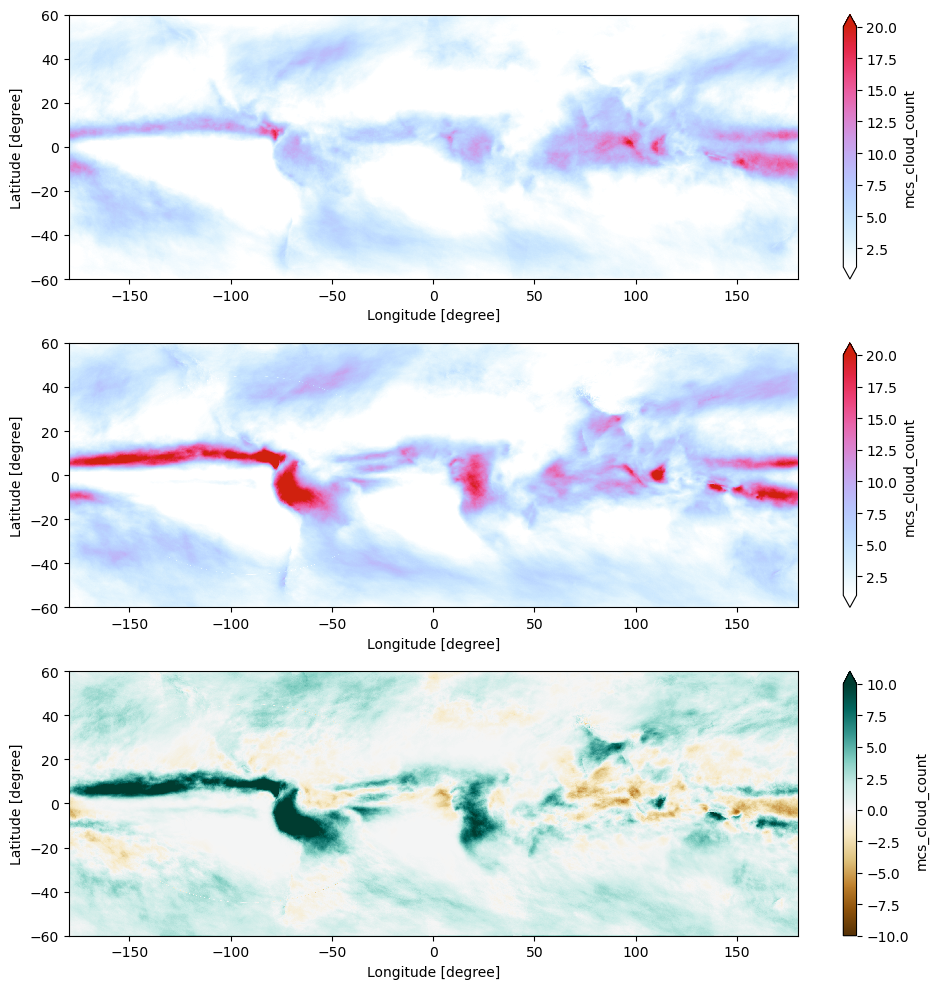

In [23]:
# Quick look plot
fig, ax = plt.subplots(nrows=3, figsize=[10,10], dpi=100)
mcscloudfreq_all_gpm.plot(vmin=1, vmax=20, cmap=cc.cm.CET_L19, ax=ax[0])
mcscloudfreq_all_m1.plot(vmin=1, vmax=20, cmap=cc.cm.CET_L19, ax=ax[1])
mcscloudfreq_all_m1_diff.plot(vmin=-10, vmax=10, cmap='BrBG', ax=ax[2])
fig.tight_layout()

In [22]:
# mcspcp_all_wrf.plot(vmin=0, vmax=12, cmap=cc.cm.rainbow_bgyrm_35_85_c71)

# Plotting Function

In [27]:
def plot_maps_mxn(nrow, ncol, da, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                  oob_colors=None, contourf=False, figsize=None, fontsize=None, cb_fontsize=None, show_cb2=False, figtitle=None,
                  map_extent=None, lonv=None, latv=None, label_lon=None, label_lat=None):
    
    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'

    # map_extent = [-150., -50., -20., 60.]
    # lonv = np.arange(-150,-50.1,20)
    # latv = np.arange(20,60.1,5)
    proj = ccrs.PlateCarree(central_longitude=0)
    data_proj = ccrs.PlateCarree()
    resolution = '50m'
    land = cfeature.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)
    states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', resolution)
    levelshgt = [1000,10000]

    fig = plt.figure(figsize=figsize, dpi=100)
    # Set up panels (nrow x ncol)
    h_ratios = list(np.repeat(1,nrow))
    w_ratios = list(np.repeat(1,ncol))
    wspace = None
    hspace = None
    gs = gridspec.GridSpec(nrow, ncol, figure=fig, height_ratios=h_ratios, width_ratios=w_ratios, wspace=wspace, hspace=hspace)
    
    # Loop over rows and columns
    for row in range(nrow):
        for col in range(ncol):
            # Check if variable is None
            Var = da[row][col]
            if (Var is not None):
                # Setup two columns (left: plot, right: colorbar)
                gss = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[row,col], height_ratios=[1], width_ratios=[1,0.02], wspace=0.02, hspace=0.)
                ax = plt.subplot(gss[0], projection=proj)
                ax.set_extent(map_extent, crs=proj)
                ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
                # ax.add_feature(states, facecolor='none', edgecolor='k', zorder=3)
                ax.set_aspect('auto', adjustable=None)
                ax.set_title(titles[row][col], loc='left')
                # Grid lines & labels
                gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
                gl.top_labels = False
                gl.right_labels = False
                gl.xlocator = mpl.ticker.FixedLocator(lonv)
                gl.ylocator = mpl.ticker.FixedLocator(latv)
                lon_formatter = LongitudeFormatter(zero_direction_label=True)
                lat_formatter = LatitudeFormatter()
                if (label_lon is not None):
                    if (label_lon[row][col]):
                        ax.set_xticks(lonv, crs=data_proj)
                        ax.xaxis.set_major_formatter(lon_formatter)
                if (label_lat is not None):
                    if (label_lat[row][col]):
                        ax.set_yticks(latv, crs=data_proj)
                        ax.yaxis.set_major_formatter(lat_formatter)

                # Terrain height
    #             ct = ax.contour(lon_ter, lat_ter, ter_s, levels=levelshgt, \
    #                             colors='dimgray', linewidths=0.5, transform=data_proj, zorder=3)

                # Select and mask data source
                Zm = np.ma.masked_where(np.isnan(Var), Var)
                lev = levels[row][col]
                cmap = copy.copy(mpl.colormaps.get_cmap(cmaps[row][col]))
                # Set out-of-bounds colors
                if oob_colors is not None:
                    oob_c = oob_colors[row][col]
                    if oob_c is not None:
                        cmap.set_over(oob_c['over'])
                        cmap.set_under(oob_c['under'])
                norm = colors.BoundaryNorm(boundaries=lev, ncolors=cmap.N)
                # Plot data
                if (contourf == False):
                    cf1 = ax.pcolormesh(lon, lat, Zm, shading='auto', norm=norm, cmap=cmap, transform=data_proj, zorder=2)
                else:
                    cf1 = ax.contourf(lon, lat, Zm, levels=levels, norm=norm, cmap=cmap, transform=data_proj, extend='both', zorder=2)

                # Colorbar
                cax = plt.subplot(gss[1])
                cbar = plt.colorbar(cf1, cax=cax, label=cblabels[row][col], ticks=cbticks[row][col], orientation='vertical', extend='both')
                cbar.ax.tick_params(labelsize=cb_fontsize)
#     # Suptitle
#     fig.suptitle(figtitle, y=0.92)
    
    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

In [28]:
# years = f'{syear_obs.min().item()}-{syear_obs.max().item()}'
# years
years = f"{datetime_range.min().strftime('%Y')}-{datetime_range.max().strftime('%Y')}"
years

'2019-2020'

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_cloudfreq_map_annual_2019-2020.png


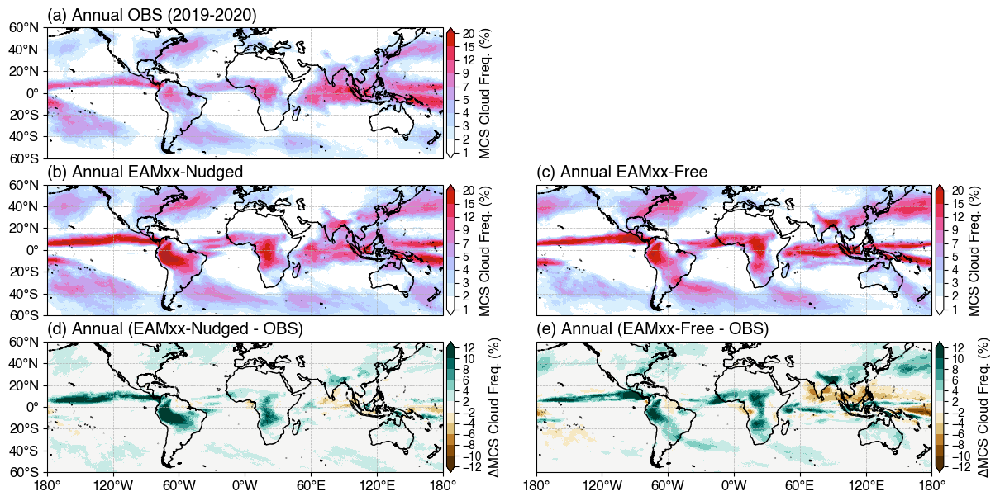

In [31]:
season = 'Annual'
mcscloudfreq_all_diff1 = mcscloudfreq_all_m1 - mcscloudfreq_all_gpm
mcscloudfreq_all_diff2 = mcscloudfreq_all_m2 - mcscloudfreq_all_gpm
dataarray = [
    [mcscloudfreq_all_gpm, None],
    [mcscloudfreq_all_m1, mcscloudfreq_all_m2],
    [mcscloudfreq_all_diff1, mcscloudfreq_all_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

# map_extent = [-130., -65., 24., 51.]
# lonv = np.arange(-130,-65.1,10)
# latv = np.arange(25,51.1,5)
map_extent = [-180., 180., -60., 60.]
lonv = np.arange(-180,180.1,60)
latv = np.arange(-60,60.1,20)

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [1,2,3,4,5,7,9,12,15,20]
lev2 = np.arange(-12,12.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
# cmap1 = copy.copy(mpl.colormaps.get_cmap('Spectral_r'))
# cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap1 = cc.cm.CET_L19
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Cloud Freq. (%)']*ncol,['MCS Cloud Freq. (%)']*ncol,[r'$\Delta$'+'MCS Cloud Freq. (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_cloudfreq_map_annual_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

In [26]:
# (mcscloudfreq_season_m1 - mcscloudfreq_season_gpm).sel(season='MAM')
# mcscloudfreq_gpm

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_cloudfreq_map_MAM_2019-2020.png


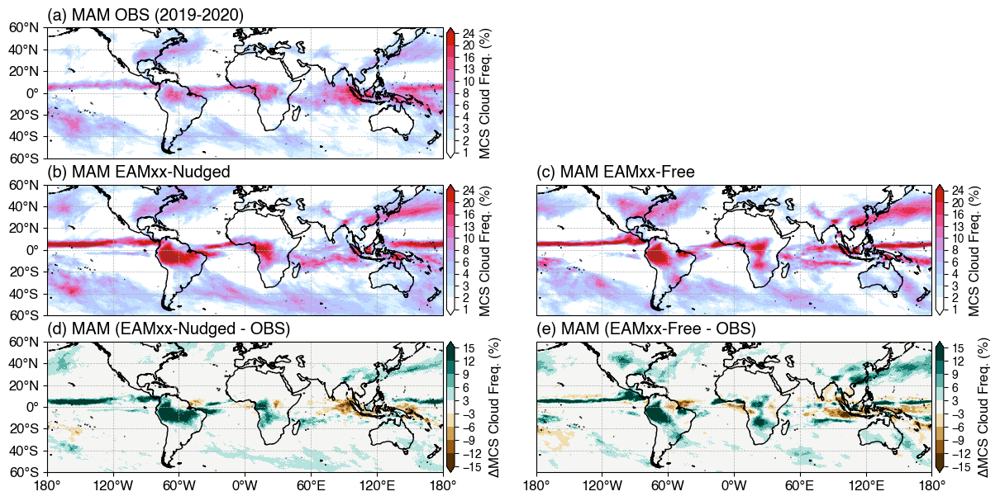

In [38]:
season = 'MAM'
mcscloudfreq_gpm = mcscloudfreq_season_gpm.sel(season=season)
mcscloudfreq_m1 = mcscloudfreq_season_m1.sel(season=season)
mcscloudfreq_m2 = mcscloudfreq_season_m2.sel(season=season)
mcscloudfreq_diff1 = (mcscloudfreq_season_m1 - mcscloudfreq_season_gpm).sel(season=season)
mcscloudfreq_diff2 = (mcscloudfreq_season_m2 - mcscloudfreq_season_gpm).sel(season=season)
dataarray = [
    [mcscloudfreq_gpm, None],
    [mcscloudfreq_m1, mcscloudfreq_m2],
    [mcscloudfreq_diff1, mcscloudfreq_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [1,2,3,4,6,8,10,13,16,20,24]
lev2 = np.arange(-15,15.1,3)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = cc.cm.CET_L19
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Cloud Freq. (%)']*ncol,['MCS Cloud Freq. (%)']*ncol,[r'$\Delta$'+'MCS Cloud Freq. (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_cloudfreq_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_cloudfreq_map_JJA_2019-2020.png


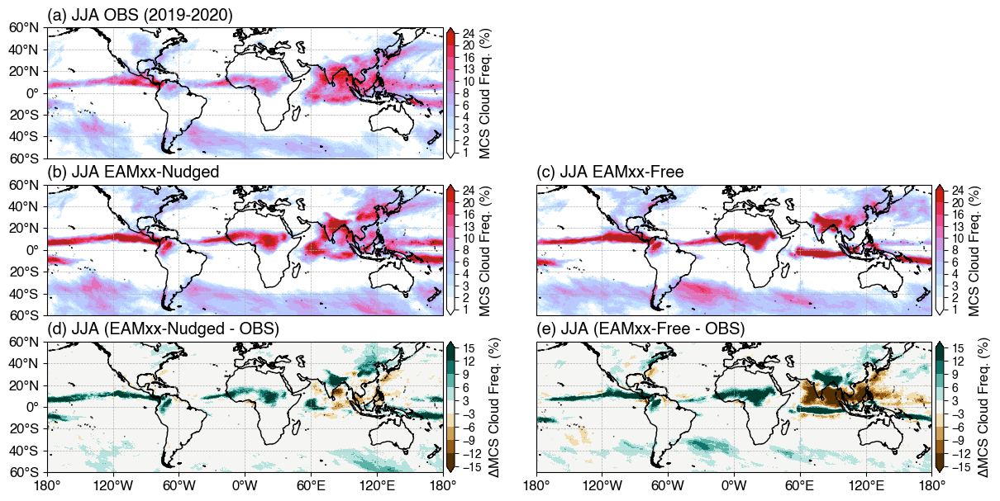

In [37]:
season = 'JJA'
mcscloudfreq_gpm = mcscloudfreq_season_gpm.sel(season=season)
mcscloudfreq_m1 = mcscloudfreq_season_m1.sel(season=season)
mcscloudfreq_m2 = mcscloudfreq_season_m2.sel(season=season)
mcscloudfreq_diff1 = (mcscloudfreq_season_m1 - mcscloudfreq_season_gpm).sel(season=season)
mcscloudfreq_diff2 = (mcscloudfreq_season_m2 - mcscloudfreq_season_gpm).sel(season=season)
dataarray = [
    [mcscloudfreq_gpm, None],
    [mcscloudfreq_m1, mcscloudfreq_m2],
    [mcscloudfreq_diff1, mcscloudfreq_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [1,2,3,4,6,8,10,13,16,20,24]
lev2 = np.arange(-15,15.1,3)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = cc.cm.CET_L19
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Cloud Freq. (%)']*ncol,['MCS Cloud Freq. (%)']*ncol,[r'$\Delta$'+'MCS Cloud Freq. (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_cloudfreq_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_cloudfreq_map_SON_2019-2020.png


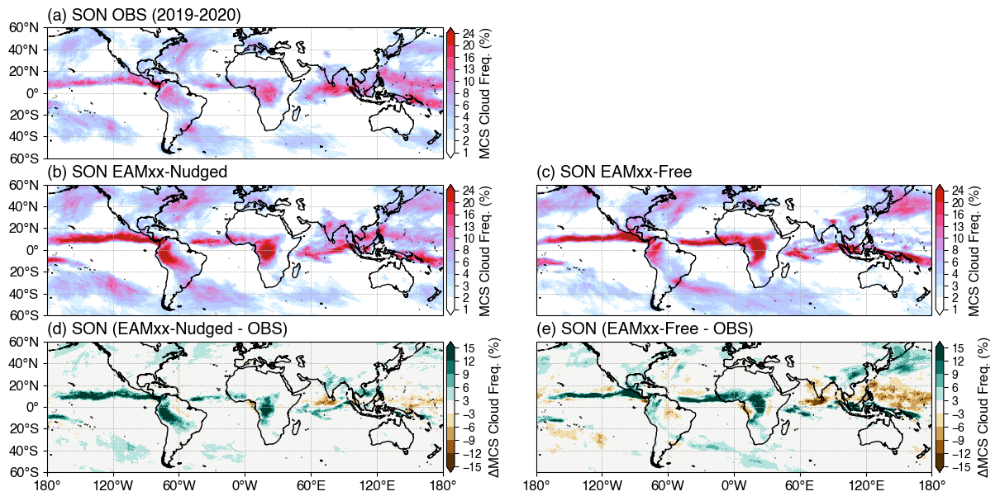

In [39]:
season = 'SON'
mcscloudfreq_gpm = mcscloudfreq_season_gpm.sel(season=season)
mcscloudfreq_m1 = mcscloudfreq_season_m1.sel(season=season)
mcscloudfreq_m2 = mcscloudfreq_season_m2.sel(season=season)
mcscloudfreq_diff1 = (mcscloudfreq_season_m1 - mcscloudfreq_season_gpm).sel(season=season)
mcscloudfreq_diff2 = (mcscloudfreq_season_m2 - mcscloudfreq_season_gpm).sel(season=season)
dataarray = [
    [mcscloudfreq_gpm, None],
    [mcscloudfreq_m1, mcscloudfreq_m2],
    [mcscloudfreq_diff1, mcscloudfreq_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [1,2,3,4,6,8,10,13,16,20,24]
lev2 = np.arange(-15,15.1,3)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = cc.cm.CET_L19
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Cloud Freq. (%)']*ncol,['MCS Cloud Freq. (%)']*ncol,[r'$\Delta$'+'MCS Cloud Freq. (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_cloudfreq_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_cloudfreq_map_DJF_2019-2020.png


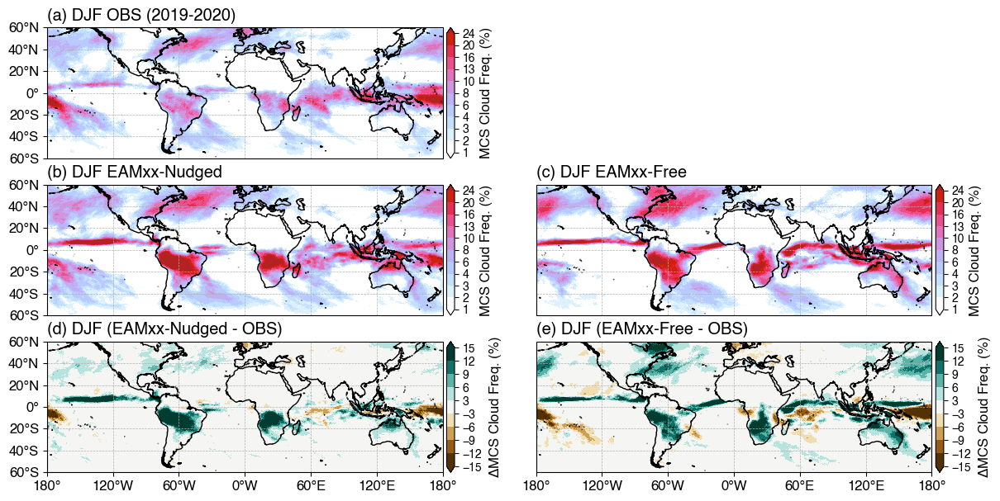

In [40]:
season = 'DJF'
mcscloudfreq_gpm = mcscloudfreq_season_gpm.sel(season=season)
mcscloudfreq_m1 = mcscloudfreq_season_m1.sel(season=season)
mcscloudfreq_m2 = mcscloudfreq_season_m2.sel(season=season)
mcscloudfreq_diff1 = (mcscloudfreq_season_m1 - mcscloudfreq_season_gpm).sel(season=season)
mcscloudfreq_diff2 = (mcscloudfreq_season_m2 - mcscloudfreq_season_gpm).sel(season=season)
dataarray = [
    [mcscloudfreq_gpm, None],
    [mcscloudfreq_m1, mcscloudfreq_m2],
    [mcscloudfreq_diff1, mcscloudfreq_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [1,2,3,4,6,8,10,13,16,20,24]
lev2 = np.arange(-15,15.1,3)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = cc.cm.CET_L19
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Cloud Freq. (%)']*ncol,['MCS Cloud Freq. (%)']*ncol,[r'$\Delta$'+'MCS Cloud Freq. (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_cloudfreq_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rain_map_annual_2019-2020.png


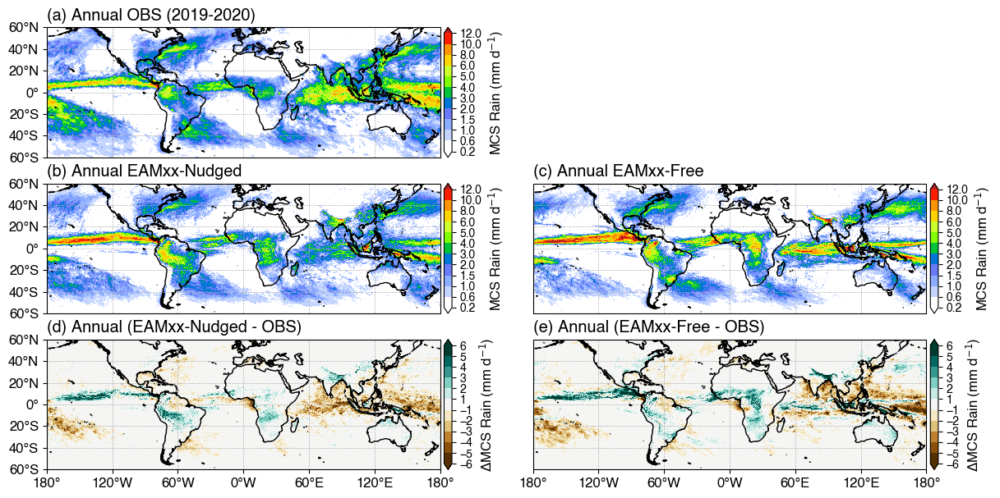

In [42]:
season = 'Annual'
mcspcp_all_diff1 = mcspcp_all_m1 - mcspcp_all_gpm
mcspcp_all_diff2 = mcspcp_all_m2 - mcspcp_all_gpm
dataarray = [
    [mcspcp_all_gpm, None],
    [mcspcp_all_m1, mcspcp_all_m2],
    [mcspcp_all_diff1, mcspcp_all_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.2,0.6,1,1.5,2,3,4,5,6,8,10,12]
lev2 = np.arange(-6,6.1,1)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain (mm d$^{-1}$)']*ncol,['MCS Rain (mm d$^{-1}$)']*ncol,[r'$\Delta$'+'MCS Rain (mm d$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rain_map_annual_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rain_map_MAM_2019-2020.png


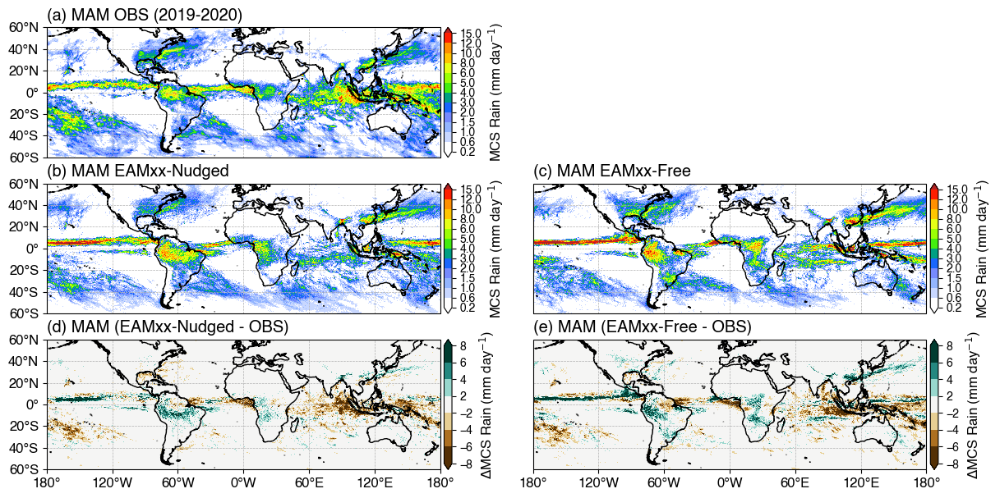

In [45]:
season = 'MAM'
mcspcp_gpm = mcspcp_season_gpm.sel(season=season)
mcspcp_m1 = mcspcp_season_m1.sel(season=season)
mcspcp_m2 = mcspcp_season_m2.sel(season=season)
mcspcp_diff1 = (mcspcp_season_m1 - mcspcp_season_gpm).sel(season=season)
mcspcp_diff2 = (mcspcp_season_m2 - mcspcp_season_gpm).sel(season=season)
dataarray = [
    [mcspcp_gpm, None],
    [mcspcp_m1, mcspcp_m2],
    [mcspcp_diff1, mcspcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.2,0.6,1,1.5,2,3,4,5,6,8,10,12,15]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain (mm day$^{-1}$)']*ncol,['MCS Rain (mm day$^{-1}$)']*ncol,[r'$\Delta$'+'MCS Rain (mm day$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rain_map_JJA_2019-2020.png


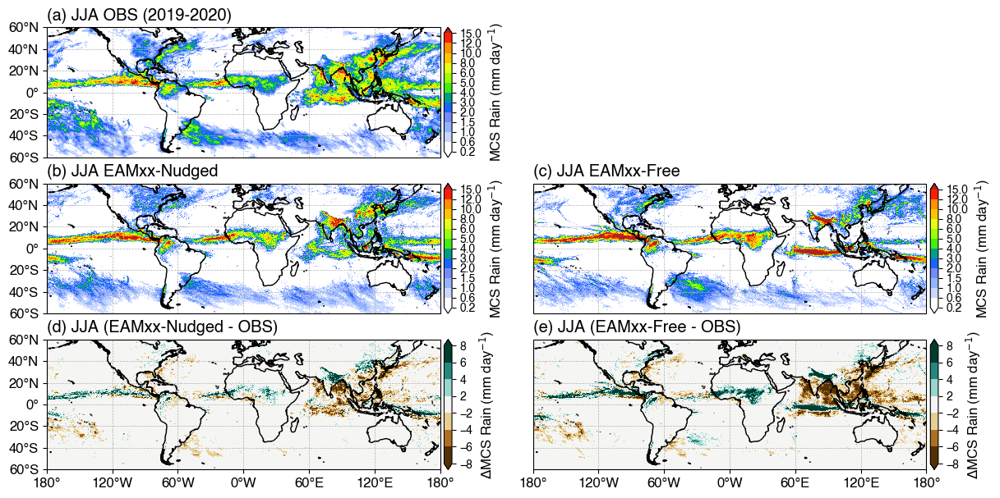

In [44]:
season = 'JJA'
mcspcp_gpm = mcspcp_season_gpm.sel(season=season)
mcspcp_m1 = mcspcp_season_m1.sel(season=season)
mcspcp_m2 = mcspcp_season_m2.sel(season=season)
mcspcp_diff1 = (mcspcp_season_m1 - mcspcp_season_gpm).sel(season=season)
mcspcp_diff2 = (mcspcp_season_m2 - mcspcp_season_gpm).sel(season=season)
dataarray = [
    [mcspcp_gpm, None],
    [mcspcp_m1, mcspcp_m2],
    [mcspcp_diff1, mcspcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.2,0.6,1,1.5,2,3,4,5,6,8,10,12,15]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain (mm day$^{-1}$)']*ncol,['MCS Rain (mm day$^{-1}$)']*ncol,[r'$\Delta$'+'MCS Rain (mm day$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rain_map_SON_2019-2020.png


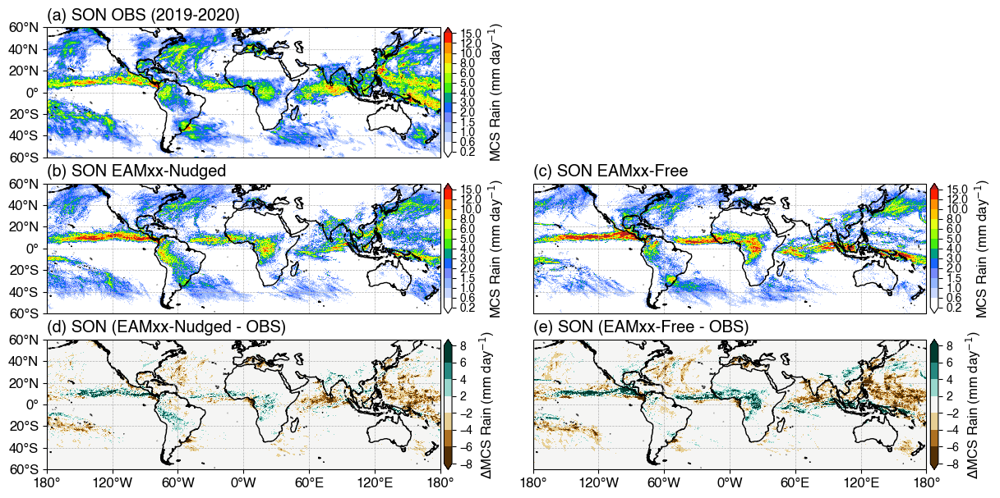

In [46]:
season = 'SON'
mcspcp_gpm = mcspcp_season_gpm.sel(season=season)
mcspcp_m1 = mcspcp_season_m1.sel(season=season)
mcspcp_m2 = mcspcp_season_m2.sel(season=season)
mcspcp_diff1 = (mcspcp_season_m1 - mcspcp_season_gpm).sel(season=season)
mcspcp_diff2 = (mcspcp_season_m2 - mcspcp_season_gpm).sel(season=season)
dataarray = [
    [mcspcp_gpm, None],
    [mcspcp_m1, mcspcp_m2],
    [mcspcp_diff1, mcspcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.2,0.6,1,1.5,2,3,4,5,6,8,10,12,15]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain (mm day$^{-1}$)']*ncol,['MCS Rain (mm day$^{-1}$)']*ncol,[r'$\Delta$'+'MCS Rain (mm day$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rain_map_DJF_2019-2020.png


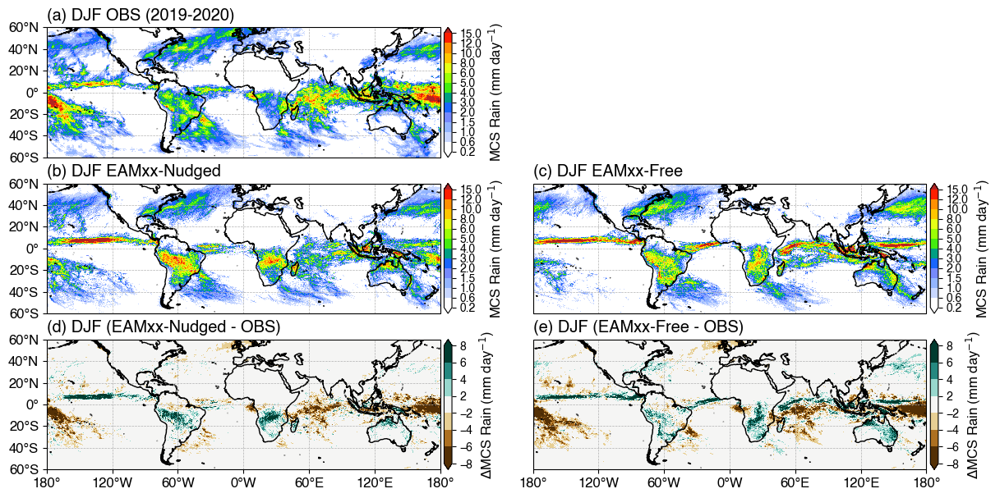

In [47]:
season = 'DJF'
mcspcp_gpm = mcspcp_season_gpm.sel(season=season)
mcspcp_m1 = mcspcp_season_m1.sel(season=season)
mcspcp_m2 = mcspcp_season_m2.sel(season=season)
mcspcp_diff1 = (mcspcp_season_m1 - mcspcp_season_gpm).sel(season=season)
mcspcp_diff2 = (mcspcp_season_m2 - mcspcp_season_gpm).sel(season=season)
dataarray = [
    [mcspcp_gpm, None],
    [mcspcp_m1, mcspcp_m2],
    [mcspcp_diff1, mcspcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.2,0.6,1,1.5,2,3,4,5,6,8,10,12,15]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain (mm day$^{-1}$)']*ncol,['MCS Rain (mm day$^{-1}$)']*ncol,[r'$\Delta$'+'MCS Rain (mm day$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rainfrac_map_annual_2019-2020.png


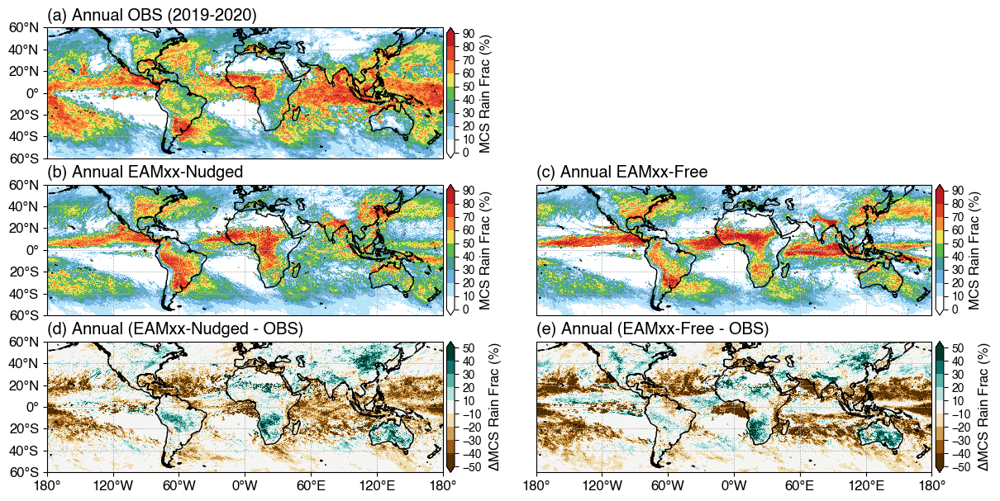

In [48]:
season = 'Annual'
mcspcpfrac_all_diff1 = mcspcpfrac_all_m1 - mcspcpfrac_all_gpm
mcspcpfrac_all_diff2 = mcspcpfrac_all_m2 - mcspcpfrac_all_gpm
dataarray = [
    [mcspcpfrac_all_gpm, None],
    [mcspcpfrac_all_m1, mcspcpfrac_all_m2],
    [mcspcpfrac_all_diff1, mcspcpfrac_all_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-50,50.1,10)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain Frac (%)']*ncol,['MCS Rain Frac (%)']*ncol,[r'$\Delta$'+'MCS Rain Frac (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rainfrac_map_annual_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rainfrac_map_MAM_2019-2020.png


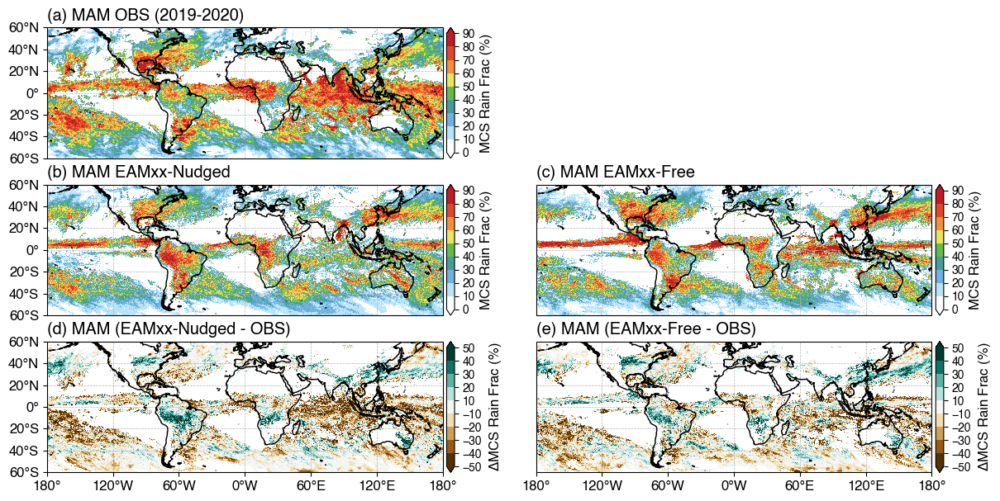

In [49]:
season = 'MAM'
pcp_thresh = 0.2  # min precipitation threshold [mm/day]
mcspcpfrac_gpm = mcspcpfrac_season_gpm.where(mcspcp_season_gpm > pcp_thresh).sel(season=season)
mcspcpfrac_m1 = mcspcpfrac_season_m1.where(mcspcp_season_m1 > pcp_thresh).sel(season=season)
mcspcpfrac_m2 = mcspcpfrac_season_m2.where(mcspcp_season_m2 > pcp_thresh).sel(season=season)
mcspcpfrac_diff1 = (mcspcpfrac_m1 - mcspcpfrac_gpm)
mcspcpfrac_diff2 = (mcspcpfrac_m2 - mcspcpfrac_gpm)
dataarray = [
    [mcspcpfrac_gpm, None],
    [mcspcpfrac_m1, mcspcpfrac_m2],
    [mcspcpfrac_diff1, mcspcpfrac_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-50,50.1,10)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain Frac (%)']*ncol,['MCS Rain Frac (%)']*ncol,[r'$\Delta$'+'MCS Rain Frac (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rainfrac_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rainfrac_map_JJA_2019-2020.png


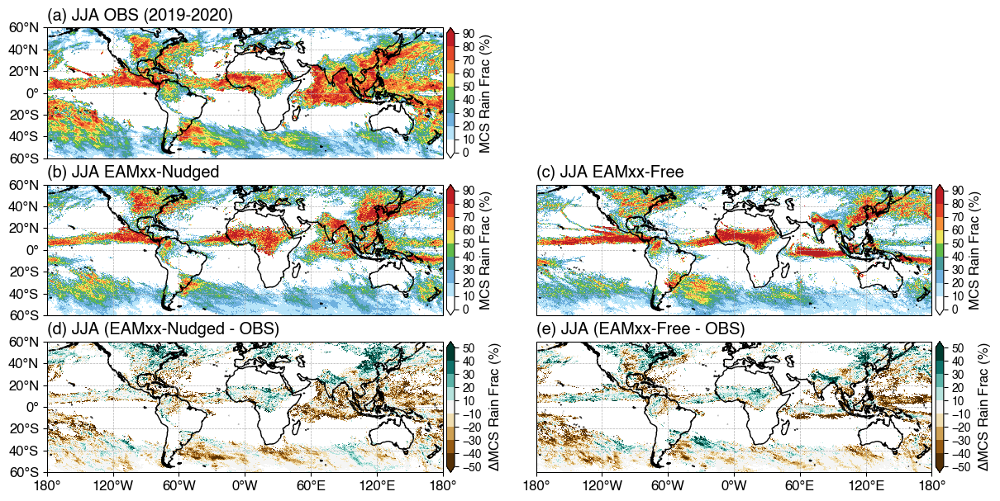

In [50]:
season = 'JJA'
pcp_thresh = 0.2  # min precipitation threshold [mm/day]
mcspcpfrac_gpm = mcspcpfrac_season_gpm.where(mcspcp_season_gpm > pcp_thresh).sel(season=season)
mcspcpfrac_m1 = mcspcpfrac_season_m1.where(mcspcp_season_m1 > pcp_thresh).sel(season=season)
mcspcpfrac_m2 = mcspcpfrac_season_m2.where(mcspcp_season_m2 > pcp_thresh).sel(season=season)
mcspcpfrac_diff1 = (mcspcpfrac_m1 - mcspcpfrac_gpm)
mcspcpfrac_diff2 = (mcspcpfrac_m2 - mcspcpfrac_gpm)
dataarray = [
    [mcspcpfrac_gpm, None],
    [mcspcpfrac_m1, mcspcpfrac_m2],
    [mcspcpfrac_diff1, mcspcpfrac_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-50,50.1,10)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain Frac (%)']*ncol,['MCS Rain Frac (%)']*ncol,[r'$\Delta$'+'MCS Rain Frac (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rainfrac_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rainfrac_map_SON_2019-2020.png


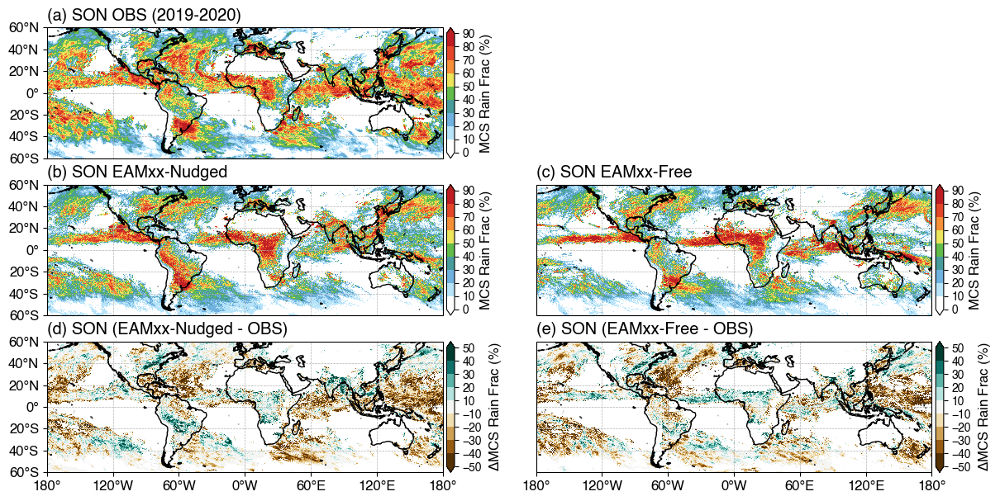

In [51]:
season = 'SON'
pcp_thresh = 0.2  # min precipitation threshold [mm/day]
mcspcpfrac_gpm = mcspcpfrac_season_gpm.where(mcspcp_season_gpm > pcp_thresh).sel(season=season)
mcspcpfrac_m1 = mcspcpfrac_season_m1.where(mcspcp_season_m1 > pcp_thresh).sel(season=season)
mcspcpfrac_m2 = mcspcpfrac_season_m2.where(mcspcp_season_m2 > pcp_thresh).sel(season=season)
mcspcpfrac_diff1 = (mcspcpfrac_m1 - mcspcpfrac_gpm)
mcspcpfrac_diff2 = (mcspcpfrac_m2 - mcspcpfrac_gpm)
dataarray = [
    [mcspcpfrac_gpm, None],
    [mcspcpfrac_m1, mcspcpfrac_m2],
    [mcspcpfrac_diff1, mcspcpfrac_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-50,50.1,10)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain Frac (%)']*ncol,['MCS Rain Frac (%)']*ncol,[r'$\Delta$'+'MCS Rain Frac (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rainfrac_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_mcs_rainfrac_map_DJF_2019-2020.png


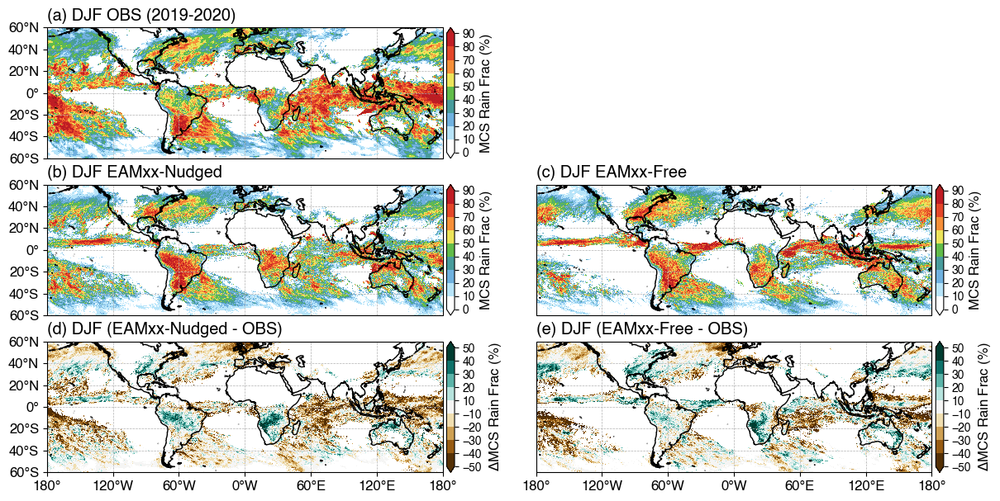

In [52]:
season = 'DJF'
pcp_thresh = 0.2  # min precipitation threshold [mm/day]
mcspcpfrac_gpm = mcspcpfrac_season_gpm.where(mcspcp_season_gpm > pcp_thresh).sel(season=season)
mcspcpfrac_m1 = mcspcpfrac_season_m1.where(mcspcp_season_m1 > pcp_thresh).sel(season=season)
mcspcpfrac_m2 = mcspcpfrac_season_m2.where(mcspcp_season_m2 > pcp_thresh).sel(season=season)
mcspcpfrac_diff1 = (mcspcpfrac_m1 - mcspcpfrac_gpm)
mcspcpfrac_diff2 = (mcspcpfrac_m2 - mcspcpfrac_gpm)
dataarray = [
    [mcspcpfrac_gpm, None],
    [mcspcpfrac_m1, mcspcpfrac_m2],
    [mcspcpfrac_diff1, mcspcpfrac_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = np.arange(0, 90.01, 10)
lev2 = np.arange(-50,50.1,10)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('WhiteBlueGreenYellowRed')
cmap1 = truncate_colormap(cmap1, 0.0, 0.9)
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['MCS Rain Frac (%)']*ncol,['MCS Rain Frac (%)']*ncol,[r'$\Delta$'+'MCS Rain Frac (%)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_mcs_rainfrac_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

## Total precipitation

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_total_rain_map_annual_2019-2020.png


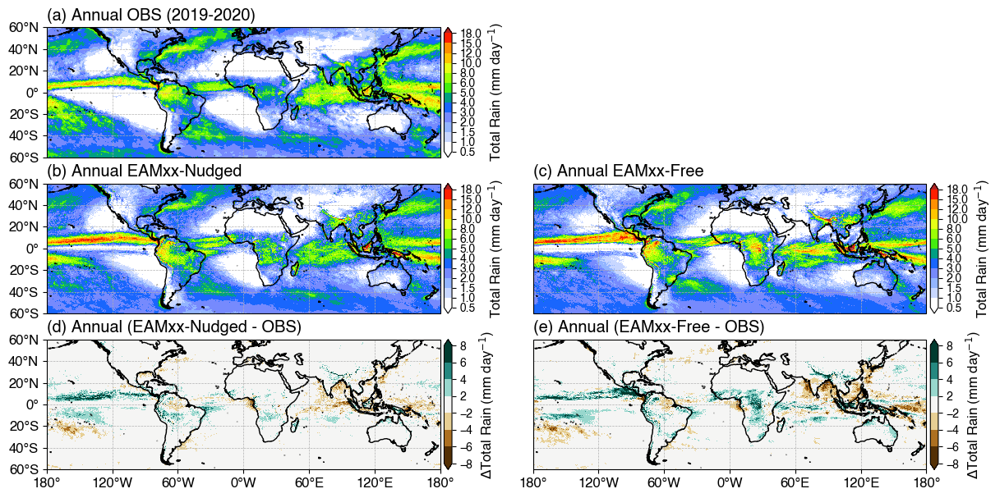

In [54]:
season = 'Annual'
totpcp_all_diff1 = totpcp_all_m1 - totpcp_all_gpm
totpcp_all_diff2 = totpcp_all_m2 - totpcp_all_gpm
dataarray = [
    [totpcp_all_gpm, None],
    [totpcp_all_m1, totpcp_all_m2],
    [totpcp_all_diff1, totpcp_all_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.5,1,1.5,2,3,4,5,6,8,10,12,15,18]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['Total Rain (mm day$^{-1}$)']*ncol,['Total Rain (mm day$^{-1}$)']*ncol,[r'$\Delta$'+'Total Rain (mm day$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_total_rain_map_annual_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_total_rain_map_MAM_2019-2020.png


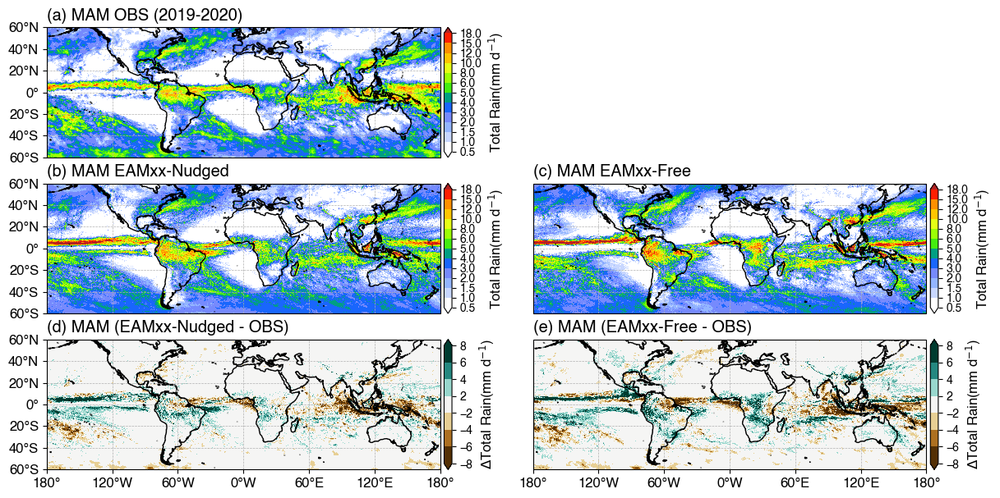

In [56]:
season = 'MAM'
totpcp_gpm = totpcp_season_gpm.sel(season=season)
totpcp_m1 = totpcp_season_m1.sel(season=season)
totpcp_m2 = totpcp_season_m2.sel(season=season)
totpcp_diff1 = (totpcp_season_m1 - totpcp_season_gpm).sel(season=season)
totpcp_diff2 = (totpcp_season_m2 - totpcp_season_gpm).sel(season=season)
dataarray = [
    [totpcp_gpm, None],
    [totpcp_m1, totpcp_m2],
    [totpcp_diff1, totpcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.5,1,1.5,2,3,4,5,6,8,10,12,15,18]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['Total Rain(mm d$^{-1}$)']*ncol,['Total Rain(mm d$^{-1}$)']*ncol,[r'$\Delta$'+'Total Rain(mm d$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_total_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_total_rain_map_JJA_2019-2020.png


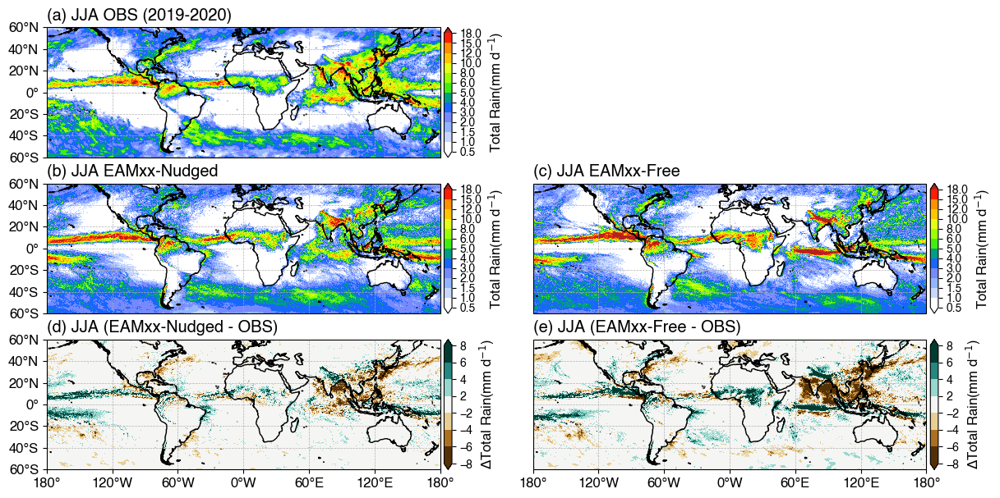

In [57]:
season = 'JJA'
totpcp_gpm = totpcp_season_gpm.sel(season=season)
totpcp_m1 = totpcp_season_m1.sel(season=season)
totpcp_m2 = totpcp_season_m2.sel(season=season)
totpcp_diff1 = (totpcp_season_m1 - totpcp_season_gpm).sel(season=season)
totpcp_diff2 = (totpcp_season_m2 - totpcp_season_gpm).sel(season=season)
dataarray = [
    [totpcp_gpm, None],
    [totpcp_m1, totpcp_m2],
    [totpcp_diff1, totpcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.5,1,1.5,2,3,4,5,6,8,10,12,15,18]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['Total Rain(mm d$^{-1}$)']*ncol,['Total Rain(mm d$^{-1}$)']*ncol,[r'$\Delta$'+'Total Rain(mm d$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_total_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_total_rain_map_SON_2019-2020.png


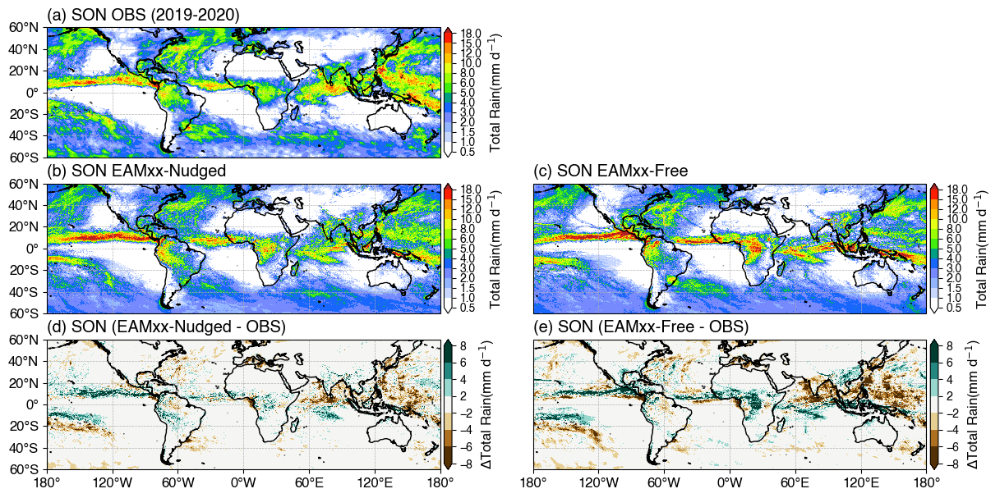

In [58]:
season = 'SON'
totpcp_gpm = totpcp_season_gpm.sel(season=season)
totpcp_m1 = totpcp_season_m1.sel(season=season)
totpcp_m2 = totpcp_season_m2.sel(season=season)
totpcp_diff1 = (totpcp_season_m1 - totpcp_season_gpm).sel(season=season)
totpcp_diff2 = (totpcp_season_m2 - totpcp_season_gpm).sel(season=season)
dataarray = [
    [totpcp_gpm, None],
    [totpcp_m1, totpcp_m2],
    [totpcp_diff1, totpcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.5,1,1.5,2,3,4,5,6,8,10,12,15,18]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['Total Rain(mm d$^{-1}$)']*ncol,['Total Rain(mm d$^{-1}$)']*ncol,[r'$\Delta$'+'Total Rain(mm d$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_total_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess/global/figures/map_obs_scream_total_rain_map_DJF_2019-2020.png


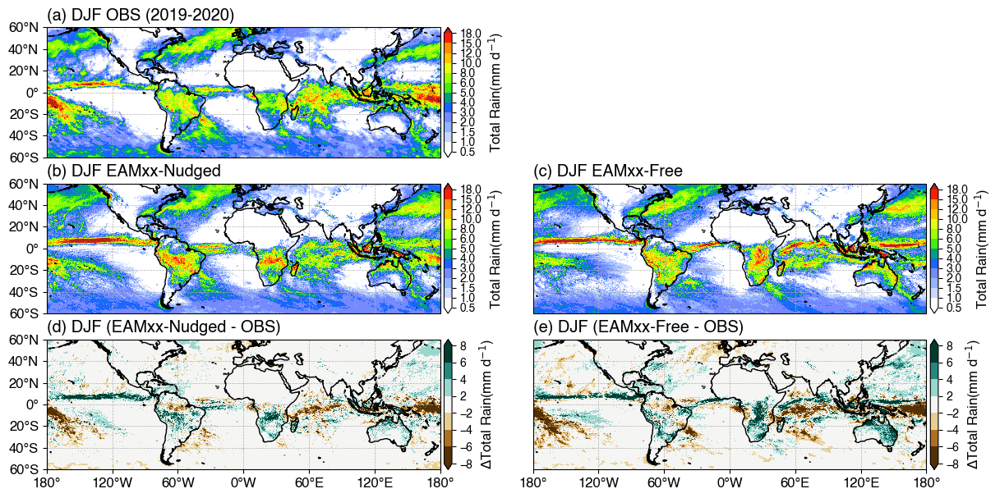

In [59]:
season = 'DJF'
totpcp_gpm = totpcp_season_gpm.sel(season=season)
totpcp_m1 = totpcp_season_m1.sel(season=season)
totpcp_m2 = totpcp_season_m2.sel(season=season)
totpcp_diff1 = (totpcp_season_m1 - totpcp_season_gpm).sel(season=season)
totpcp_diff2 = (totpcp_season_m2 - totpcp_season_gpm).sel(season=season)
dataarray = [
    [totpcp_gpm, None],
    [totpcp_m1, totpcp_m2],
    [totpcp_diff1, totpcp_diff2],
]
nrow = len(dataarray)
ncol = len(dataarray[0])

figwidth = 14
height_ratio_per_panel = (map_extent[3] - map_extent[2]) / (map_extent[1] - map_extent[0])
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth,figheight]

# Set up contour levels and colormaps
lev1 = [0.5,1,1.5,2,3,4,5,6,8,10,12,15,18]
lev2 = np.arange(-8,8.1,2)
# Remove mid-point (0 value)
idx = int((len(lev2)-1)/2)
lev2 = np.delete(lev2, idx)
levels = [[lev1]*ncol, [lev1]*ncol, [lev2]*ncol]
cmap1 = generate_NCL_cmap('precip3_16lev', cont_opt=True, cont_param_n=16, cont_param_ws='sRGB')
cmap2 = copy.copy(mpl.colormaps.get_cmap('BrBG'))
cmaps = [[cmap1]*ncol,[cmap1]*ncol,[cmap2]*ncol]
# Specify lat/lon labels
label_lon = [[False,False],[False,False],[True,True]]
label_lat = [[True,False],[True,False],[True,False]]

titles = [
    [f"(a) {season} {name_map1['obs']} ({years})", f"(b) {season} {name_map1['obs']} ({years})"], 
    [f"(b) {season} {name_map1['m1']}", f"(c) {season} {name_map1['m2']}"],
    [f"(d) {season} ({name_map1['m1']} - OBS)", f"(e) {season} ({name_map1['m2']} - OBS)"],
]
cblabels = [['Total Rain(mm d$^{-1}$)']*ncol,['Total Rain(mm d$^{-1}$)']*ncol,[r'$\Delta$'+'Total Rain(mm d$^{-1}$)']*ncol]
cbticks = levels
figname = f"{figdir}map_obs_scream_total_rain_map_{season}_{years}.png"
oob_colors = [
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [{'under':'white', 'over':'firebrick'}]*ncol,
    [None]*ncol,
]
# oob_colors = None
fontsize = 12
cb_fontsize = 10
print(figname)

fig = plot_maps_mxn(nrow, ncol, dataarray, lon, lat, titles, levels, cmaps, cblabels, cbticks, figname, 
                    figsize=figsize, fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False, oob_colors=oob_colors, show_cb2=False,
                    map_extent=map_extent, lonv=lonv, latv=latv, label_lon=label_lon, label_lat=label_lat)